In [10]:
%pylab inline
import os
import gc
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

from ddmap import halosim
from ddmap.pixel3D import cartesianGrid3D
from ddmap.sparse import darkmapper

Populating the interactive namespace from numpy and matplotlib


In [41]:
# configuration
configName  =   '../../tests/config_sparse.ini' 
parser      =   ConfigParser()
parser.read(configName)

# Reconstruction Init
parser.set('sparse','mu','2e-4')
if True:
    atomFname='../../tests/haloBasis-nl10-pix48-m146_152.fits'
    parser.set('lens','atomFname',atomFname)
    parser.set('sparse','nframe','1' )
else:
    parser.set('lens','resolve_lim','0.4') #pix
    parser.set('lens','rs_base','0.12')    #Mpc/h
    parser.set('sparse','nframe','3' )
    
# Pixelation
gridInfo=   cartesianGrid3D(parser)
Z,Y,X   =   np.meshgrid(gridInfo.zcgrid,gridInfo.ycgrid,gridInfo.xcgrid,indexing='ij')
x,y,z   =   (X.flatten(),Y.flatten(),Z.flatten())
lensKer1 =   gridInfo.lensing_kernel(deltaIn=False)
lensKer2 =   gridInfo.lensing_kernel(deltaIn=True)

In [42]:
z_h     =  0.25
log_m   =  14.74
M_200   =  10.**(log_m)
conc    =  6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
halo    =  halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
lk      =  halo.lensKernel(z)
data2   =  halo.DeltaSigmaComplex(x*3600.,y*3600.)*lk
data2   =  data2.reshape(gridInfo.shape)
gErr    =  np.ones(gridInfo.shape)*1e-3

dmapper=darkmapper(parser,data2.real,data2.imag,gErr,lensKer1)

# sparse analysis

In [43]:
%%time
dmapper.lbd=0.
dmapper.lcd=1.
dmapper.nonNeg=False
dmapper.clean_outcomes()
dmapper.optimized_gradient_descent(3000)
dmapper.reconstruct()

CPU times: user 1.5 s, sys: 3.26 ms, total: 1.5 s
Wall time: 1.5 s


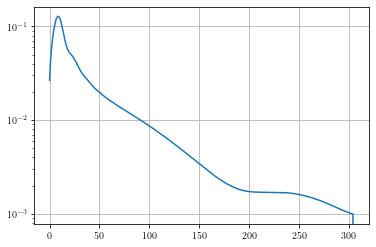

In [44]:
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 2.91 s, sys: 0 ns, total: 2.91 s
Wall time: 2.92 s


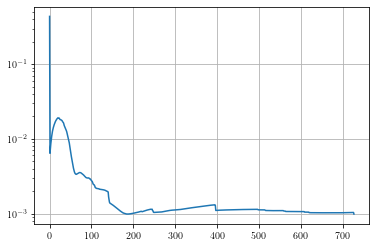

In [45]:
%%time
dmapper.lbd=2.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(800,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 819 ms, sys: 0 ns, total: 819 ms
Wall time: 820 ms


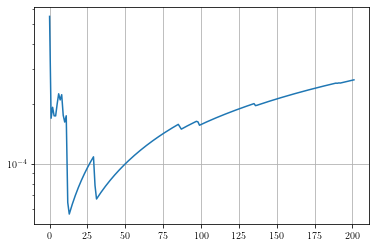

In [46]:
%%time
dmapper.lbd=4.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(800,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

In [47]:
from ddmap import detect3D
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(dmapper.deltaR[:,:,:])
data1   =   np.hstack([c1,v1[:,None]])
src     =   Table(data=data1,names=names)

In [48]:
src

iz,iy,ix,value
float64,float64,float64,float64
5.0,24.0,24.0,30.85530330182532
